In [107]:
import datetime
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import cufflinks as cf
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()
%matplotlib inline

def load_data(filename):
    """
    Funzione per il parsing di una serie intraday 
    con estensione txt esportata da Tradestation
    """
    data = pd.read_csv(filename, 
                       usecols=['Date','Time','Open','High','Low','Close','Up','Down'], 
                       parse_dates=[['Date', 'Time']], )
    data.columns = ["date_time","open","high","low","close","up","down"]
    data.set_index('date_time', inplace = True)
    data['volume'] = data['up'] + data['down']
    data.drop(['up','down'], axis=1, inplace=True)
    return data

filename = "@NG_60min_Exchange.txt"
dataset = load_data(filename)
dataset["hour"] = dataset.index.hour
dataset['body'] = (dataset.close - dataset.open)
dataset.tail(23)

,open,high,low,close,volume,hour,body
date_time,,,,,,,
2019-11-14 19:00:00,2.636,2.642,2.618,2.627,1456,19,-0.009
2019-11-14 20:00:00,2.628,2.631,2.623,2.628,398,20,0.000
2019-11-14 21:00:00,2.628,2.631,2.626,2.630,440,21,0.002
2019-11-14 22:00:00,2.629,2.629,2.623,2.626,263,22,-0.003
2019-11-14 23:00:00,2.626,2.637,2.626,2.632,512,23,0.006
2019-11-15 00:00:00,2.632,2.634,2.609,2.611,1271,0,-0.021
2019-11-15 01:00:00,2.611,2.622,2.606,2.613,1900,1,0.002
2019-11-15 02:00:00,2.612,2.617,2.609,2.612,495,2,0.000
2019-11-15 03:00:00,2.613,2.627,2.609,2.621,1902,3,0.008


In [108]:
dataset.iplot(kind='candle',theme='white',
              up_color='green', down_color='red',
              title = "Gold Futures Continuous [GC]", xTitle = "Time", yTitle = "Price")

In [109]:
dataset[-23:].iplot(kind='candle',theme='white',
                        up_color='green', down_color='red',
                        title = "Gold Futures Continuous [GC]", xTitle = "Time", yTitle = "Price")

Filtriamo per esempio tutti i record alle ore 0 e visualizziamo i primi 10:

In [110]:
dataset[(dataset.hour == 0)].body.head(10)

date_time
2007-01-02    0.000
2007-01-03    0.006
2007-01-04    0.000
2007-01-05   -0.035
2007-01-08   -0.021
2007-01-09   -0.003
2007-01-10   -0.010
2007-01-11   -0.024
2007-01-12    0.002
2007-01-15    0.012
Name: body, dtype: float64

In [111]:
round(dataset[(dataset.hour == 0)].body.mean(),2)

0.0

In [112]:
dataset[(dataset.hour == 0)].body.count()

3274

In [113]:
round(dataset[(dataset.hour == 10)].body.mean(),2)

-0.0

In [114]:
dataset[(dataset.hour == 10)].body.count()

3315

La differenza non deve stupirci dal momento che durante l'anno ci sono molte sessioni incomplete dovute a festività!

In [115]:
hours = []

for hour in range(0,24):
    hours.append(hour)
    
print(hours)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]


In [116]:
hour_bias = []

for hour in hours:
    hour_bias.append(dataset[(dataset.hour == hour)].body.mean())
    
hour_bias

[1.5271838729526473e-06,
 5.3456221198175625e-05,
 6.892269481529089e-05,
 -0.0003240654927401918,
 -0.0001935385553185257,
 2.2208700943103664e-05,
 7.759927250683566e-05,
 0.00031448442697306066,
 -0.0008288043478260925,
 -0.002028666264333141,
 -0.0011613876319758495,
 -0.002033192516596244,
 -0.00043408748114632,
 -8.416289592758396e-05,
 -0.0007105423522242297,
 0.0007290959580376402,
 0.0009160752854057315,
 0.001100957085520241,
 nan,
 0.0007285671008785052,
 -0.00017932296431836812,
 8.85416666666644e-05,
 -8.019589837771941e-05,
 -0.000469706242350049]

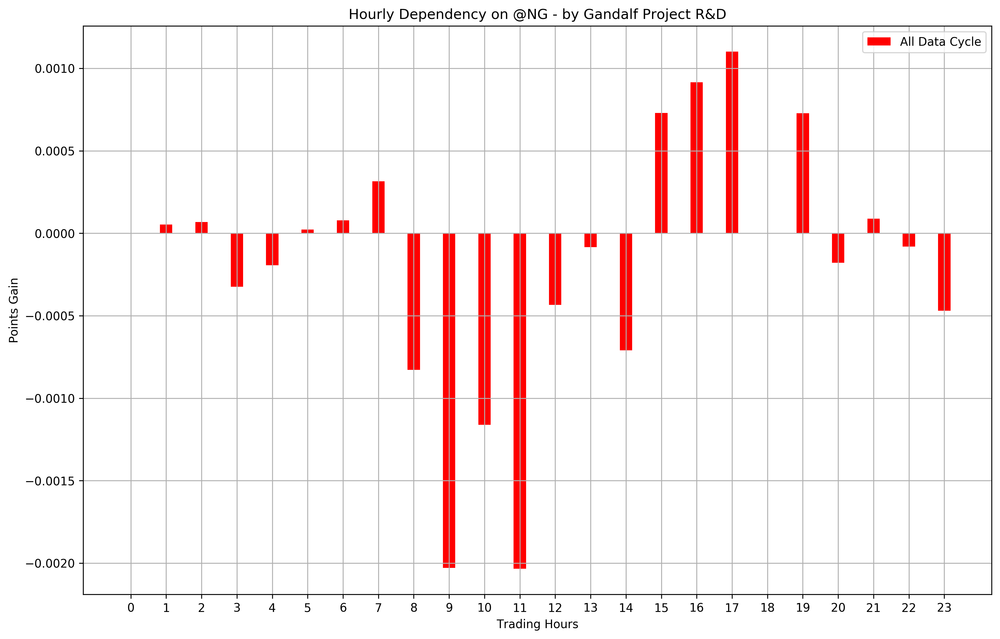

In [117]:
# MODULO GRAFICO **************************************
n_groups = 24

fig, ax = plt.subplots(figsize=(14, 9), dpi=300)

index = np.arange(n_groups)
bar_width = 0.35
opacity = 1

rects1 = ax.bar(index, 
                hour_bias, 
                bar_width,
                alpha=opacity,
                color='red',
                label='All Data Cycle')

ax.set_xlabel('Trading Hours')
ax.set_ylabel('Points Gain')
ax.set_title('Hourly Dependency on ' + filename.split('_')[0] + ' - by Gandalf Project R&D')
ax.set_xticks(index)
ax.set_xticklabels((['0','1','2','3','4','5','6','7','8','9','10','11','12',
                     '13','14','15','16','17','18','19','20','21','22','23']))
ax.legend()
ax.grid(True)
plt.show()
# MODULO GRAFICO **************************************

In [118]:
def normalizeMinMax(array):
    """
    Funzione per normalizzare un array
    che porta a 0 il valore minimo
    e ad 1 il valore massimo
    (a[i] - min(a))/(max(a)-min(a)) 
    """
    normalized_array = []
    for elements in array:
        normalized_array.append((elements - min(array))/(max(array)-min(array)))
    return normalized_array

def normalizeMax(array):
    """
    Funzione per normalizzare un array
    che porta ad 1 il valore massimo
    a[i]/max(a)
    """
    normalized_array = []
    for elements in array:
        normalized_array.append(elements / max(array))
    return normalized_array

def normalizeMaxMin(array):
    """
    Funzione per normalizzare un array
    che porta ad 1 il valore massimo
    a[i]/max(a) e a -1 il valore minimo a[i]/min(a)
    Funzione che lascia lo zero invariato!
    """
    normalized_array = []
    for element in array:
        if element > 0:
            normalized_array.append(element / max(array))
        else:
            normalized_array.append(-element / min(array))
    return normalized_array

In [119]:
normalize = True
    
if normalize == True:
    hour_bias = normalizeMaxMin(hour_bias)

hour_bias

[0.0013871420539802413,
 0.04855431869346268,
 0.0626025262217396,
 -0.1593875100832596,
 -0.0951894883237754,
 0.020172176768006606,
 0.07048346709187786,
 0.2856463990369395,
 -0.4076369261940768,
 -0.9977738201246774,
 -0.5712138041507854,
 -1.0,
 -0.21350043225273294,
 -0.04139445489819163,
 -0.34947126080010593,
 0.662238308492394,
 0.8320717468954331,
 1.0,
 nan,
 0.6617579472084796,
 -0.08819772985323183,
 0.08042245045802611,
 -0.039443337373666364,
 -0.231019069033552]

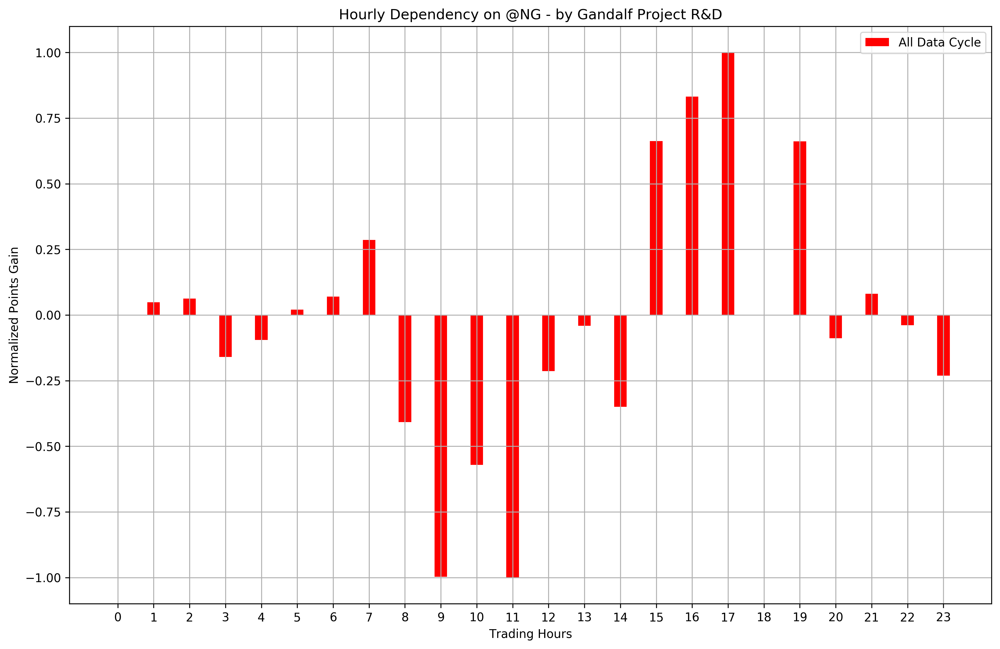

In [120]:
# MODULO GRAFICO **************************************
n_groups = 24

fig, ax = plt.subplots(figsize=(14, 9), dpi=300)

index = np.arange(n_groups)
bar_width = 0.35
opacity = 1

rects1 = ax.bar(index, 
                hour_bias, 
                bar_width,
                alpha=opacity,
                color='red',
                label='All Data Cycle')

ax.set_xlabel('Trading Hours')
if normalize == True:
    ax.set_ylabel('Normalized Points Gain')
else:
    ax.set_ylabel('Points Gain')
ax.set_title('Hourly Dependency on ' + filename.split('_')[0] + ' - by Gandalf Project R&D')
ax.set_xticks(index)
ax.set_xticklabels((['0','1','2','3','4','5','6','7','8','9','10','11','12',
                     '13','14','15','16','17','18','19','20','21','22','23']))

ax.legend()
ax.grid(True)
plt.show()
# MODULO GRAFICO **************************************

### Ripetendo l'analisi su tre periodi temporali differenti:

In [121]:
#******* INPUT *********************************

filename = "@NG_60min_Exchange.txt"

startDateLong = "20070101"
endDateLong = "20191015"

startDateMid = "20150101"
endDateMid = "20191015"

startDateShort = "20181015"
endDateShort = "20191015"

normalize = False

#******* INPUT *********************************

In [122]:
dataset = load_data(filename)
dataset["hour"] = dataset.index.hour
dataset['body'] = (dataset.close - dataset.open)
dataset.tail(23)

,open,high,low,close,volume,hour,body
date_time,,,,,,,
2019-11-14 19:00:00,2.636,2.642,2.618,2.627,1456,19,-0.009
2019-11-14 20:00:00,2.628,2.631,2.623,2.628,398,20,0.000
2019-11-14 21:00:00,2.628,2.631,2.626,2.630,440,21,0.002
2019-11-14 22:00:00,2.629,2.629,2.623,2.626,263,22,-0.003
2019-11-14 23:00:00,2.626,2.637,2.626,2.632,512,23,0.006
2019-11-15 00:00:00,2.632,2.634,2.609,2.611,1271,0,-0.021
2019-11-15 01:00:00,2.611,2.622,2.606,2.613,1900,1,0.002
2019-11-15 02:00:00,2.612,2.617,2.609,2.612,495,2,0.000
2019-11-15 03:00:00,2.613,2.627,2.609,2.621,1902,3,0.008


In [123]:
dataset.index.min()

Timestamp('2007-01-01 19:00:00')

In [124]:
dataset.index.max()

Timestamp('2019-11-15 17:00:00')

In [125]:
startDateLongParsed = datetime.date(int(startDateLong[0:4]), int(startDateLong[4:6]), int(startDateLong[6:]))
endDateLongParsed = datetime.date(int(endDateLong[0:4]), int(endDateLong[4:6]), int(endDateLong[6:]))

startDateMidParsed = datetime.date(int(startDateMid[0:4]), int(startDateMid[4:6]), int(startDateMid[6:]))
endDateMidParsed = datetime.date(int(endDateMid[0:4]), int(endDateMid[4:6]), int(endDateMid[6:]))

startDateShortParsed = datetime.date(int(startDateShort[0:4]), int(startDateShort[4:6]), int(startDateShort[6:]))
endDateShortParsed = datetime.date(int(endDateShort[0:4]), int(endDateShort[4:6]), int(endDateShort[6:]))

instrument_Long = dataset.loc[startDateLongParsed:endDateLongParsed]
instrument_Mid = dataset.loc[startDateMidParsed:endDateMidParsed]
instrument_Short = dataset.loc[startDateShortParsed:endDateShortParsed]

hour_bias_long = []
hour_bias_mid = []
hour_bias_short = []

hours = []
for hour in range(0,24):
    hours.append(hour)

for hour in hours:
    hour_bias_long.append(instrument_Long[(instrument_Long.hour == hour)].body.mean())
    hour_bias_mid.append(instrument_Mid[(instrument_Mid.hour == hour)].body.mean())
    hour_bias_short.append(instrument_Short[(instrument_Short.hour == hour)].body.mean())
    
if normalize == True:
    hour_bias_long = normalizeMaxMin(hour_bias_long)
    hour_bias_mid = normalizeMaxMin(hour_bias_mid)
    hour_bias_short = normalizeMaxMin(hour_bias_short)

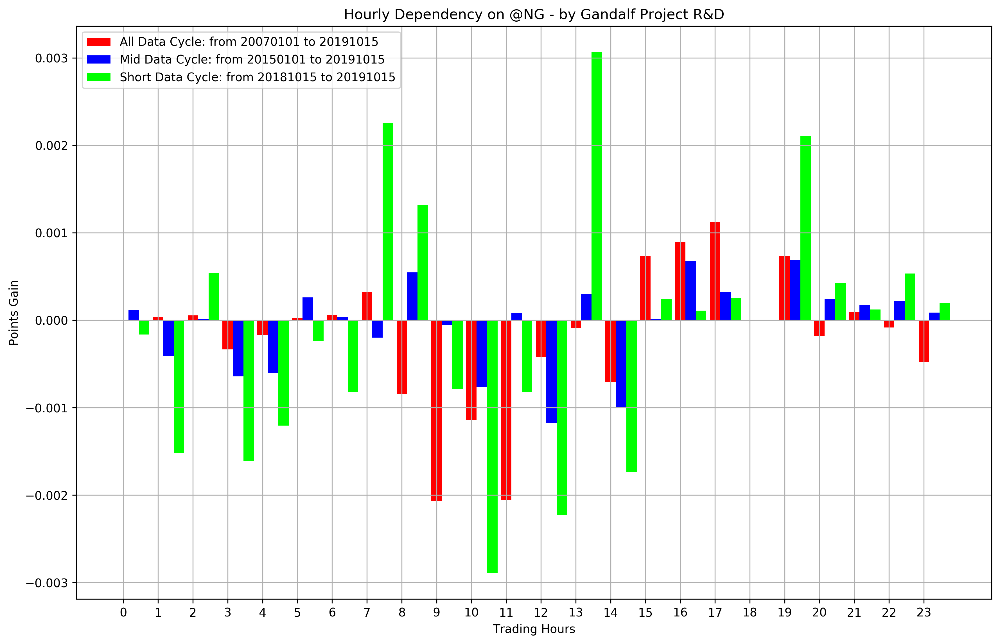

In [126]:
# MODULO GRAFICO **************************************
n_groups = 24
fig, ax = plt.subplots(figsize=(14, 9), dpi=300)
index = np.arange(n_groups)
bar_width = 0.30
opacity = 1

label_all = "All Data Cycle: from " + startDateLong + " to " + endDateLong
label_mid = "Mid Data Cycle: from " + startDateMid + " to " + endDateMid
label_short = "Short Data Cycle: from " + startDateShort + " to " + endDateShort

rects1 = plt.bar(index, 
                 hour_bias_long, 
                 bar_width,
                 alpha=opacity,
                 color='red',
                 label=label_all)
rects2 = plt.bar(index + bar_width, 
                 hour_bias_mid, 
                 bar_width,
                 alpha=opacity,
                 color='blue',
                 label=label_mid)
rects3 = plt.bar(index + 2 * bar_width, 
                 hour_bias_short, 
                 bar_width,
                 alpha=opacity,
                 color='lime',
                 label=label_short)

ax.set_xlabel('Trading Hours')
if normalize == True:
    ax.set_ylabel('Normalized Points Gain')
else:
    ax.set_ylabel('Points Gain')
ax.set_title('Hourly Dependency on ' + filename.split('_')[0] + ' - by Gandalf Project R&D')
ax.set_xticks(index)
ax.set_xticklabels((['0','1','2','3','4','5','6','7','8','9','10','11','12',
                     '13','14','15','16','17','18','19','20','21','22','23']))
ax.legend()
ax.grid(True)
plt.show()
# MODULO GRAFICO **************************************

In [127]:
#******* INPUT *********************************

filename = "@NG_60min_Exchange.txt"

startDateLong = "20070101"
endDateLong = "20191015"

startDateMid = "20150101"
endDateMid = "20191015"

startDateShort = "20181015"
endDateShort = "20191015"

normalize = True

#******* INPUT *********************************

In [128]:
dataset = load_data(filename)
dataset["hour"] = dataset.index.hour
dataset['body'] = (dataset.close - dataset.open)
dataset.tail(23)

,open,high,low,close,volume,hour,body
date_time,,,,,,,
2019-11-14 19:00:00,2.636,2.642,2.618,2.627,1456,19,-0.009
2019-11-14 20:00:00,2.628,2.631,2.623,2.628,398,20,0.000
2019-11-14 21:00:00,2.628,2.631,2.626,2.630,440,21,0.002
2019-11-14 22:00:00,2.629,2.629,2.623,2.626,263,22,-0.003
2019-11-14 23:00:00,2.626,2.637,2.626,2.632,512,23,0.006
2019-11-15 00:00:00,2.632,2.634,2.609,2.611,1271,0,-0.021
2019-11-15 01:00:00,2.611,2.622,2.606,2.613,1900,1,0.002
2019-11-15 02:00:00,2.612,2.617,2.609,2.612,495,2,0.000
2019-11-15 03:00:00,2.613,2.627,2.609,2.621,1902,3,0.008


In [129]:
startDateLongParsed = datetime.date(int(startDateLong[0:4]), int(startDateLong[4:6]), int(startDateLong[6:]))
endDateLongParsed = datetime.date(int(endDateLong[0:4]), int(endDateLong[4:6]), int(endDateLong[6:]))

startDateMidParsed = datetime.date(int(startDateMid[0:4]), int(startDateMid[4:6]), int(startDateMid[6:]))
endDateMidParsed = datetime.date(int(endDateMid[0:4]), int(endDateMid[4:6]), int(endDateMid[6:]))

startDateShortParsed = datetime.date(int(startDateShort[0:4]), int(startDateShort[4:6]), int(startDateShort[6:]))
endDateShortParsed = datetime.date(int(endDateShort[0:4]), int(endDateShort[4:6]), int(endDateShort[6:]))

instrument_Long = dataset.loc[startDateLongParsed:endDateLongParsed]
instrument_Mid = dataset.loc[startDateMidParsed:endDateMidParsed]
instrument_Short = dataset.loc[startDateShortParsed:endDateShortParsed]

hour_bias_long = []
hour_bias_mid = []
hour_bias_short = []

hours = []
for hour in range(0,24):
    hours.append(hour)

for hour in hours:
    hour_bias_long.append(instrument_Long[(instrument_Long.hour == hour)].body.mean())
    hour_bias_mid.append(instrument_Mid[(instrument_Mid.hour == hour)].body.mean())
    hour_bias_short.append(instrument_Short[(instrument_Short.hour == hour)].body.mean())
    
if normalize == True:
    hour_bias_long = normalizeMaxMin(hour_bias_long)
    hour_bias_mid = normalizeMaxMin(hour_bias_mid)
    hour_bias_short = normalizeMaxMin(hour_bias_short)

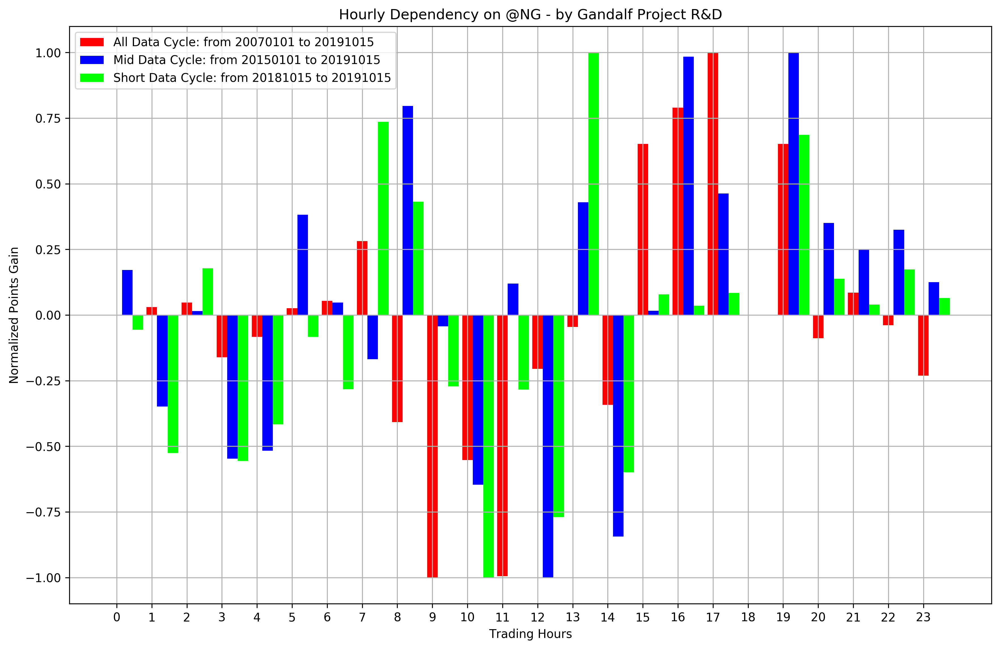

In [130]:
# MODULO GRAFICO **************************************
n_groups = 24
fig, ax = plt.subplots(figsize=(14, 9), dpi=300)
index = np.arange(n_groups)
bar_width = 0.30
opacity = 1

label_all = "All Data Cycle: from " + startDateLong + " to " + endDateLong
label_mid = "Mid Data Cycle: from " + startDateMid + " to " + endDateMid
label_short = "Short Data Cycle: from " + startDateShort + " to " + endDateShort

rects1 = plt.bar(index, 
                 hour_bias_long, 
                 bar_width,
                 alpha=opacity,
                 color='red',
                 label=label_all)
rects2 = plt.bar(index + bar_width, 
                 hour_bias_mid, 
                 bar_width,
                 alpha=opacity,
                 color='blue',
                 label=label_mid)
rects3 = plt.bar(index + 2 * bar_width, 
                 hour_bias_short, 
                 bar_width,
                 alpha=opacity,
                 color='lime',
                 label=label_short)

ax.set_xlabel('Trading Hours')
if normalize == True:
    ax.set_ylabel('Normalized Points Gain')
else:
    ax.set_ylabel('Points Gain')
ax.set_title('Hourly Dependency on ' + filename.split('_')[0] + ' - by Gandalf Project R&D')
ax.set_xticks(index)
ax.set_xticklabels((['0','1','2','3','4','5','6','7','8','9','10','11','12',
                     '13','14','15','16','17','18','19','20','21','22','23']))
ax.legend()
ax.grid(True)
plt.show()
# MODULO GRAFICO **************************************

### Statistiche Profonde

In [131]:
def percPosNeg(array, soglia):
    """
    Funzione che restituisce le percentuali di valori 
    maggiori e minori di una soglia
    """
    if len(array) == 0:
        return 0,0
    contapos = 0
    contaneg = 0
    for el in array:
        if el > soglia:
            contapos+=1
        if el <= soglia:
            contaneg+=1
    return round(contapos/len(array)*100,2), round(contaneg/len(array)*100,2)

In [132]:
hours = []
for hour in range(0,24):
    hours.append(hour)
    
body_statistics_long = [] 
body_statistics_mid = [] 
body_statistics_short = [] 

for hour in hours:
    
    if instrument_Long[(instrument_Long.hour==hour)].body.count()!=0:
        if instrument_Long[(instrument_Long.hour==hour)].body.mean() > 0:
            body_statistics_long.append(
                percPosNeg(instrument_Long[(instrument_Long.hour==hour)]['body'],0)[0])
        if instrument_Long[(instrument_Long.hour==hour)]['body'].mean() <= 0:
            body_statistics_long.append(
                percPosNeg(instrument_Long[(instrument_Long.hour==hour)]['body'],0)[1])
    else:
        body_statistics_long.append(0)
        
    if instrument_Mid[(instrument_Mid.hour==hour)]['body'].count()!=0:
        if instrument_Mid[(instrument_Mid.hour==hour)]['body'].mean() > 0:
            body_statistics_mid.append(
                percPosNeg(instrument_Mid[(instrument_Mid.hour==hour)]['body'],0)[0])
        if instrument_Mid[(instrument_Mid.hour==hour)]['body'].mean() <= 0:
            body_statistics_mid.append(
                percPosNeg(instrument_Mid[(instrument_Mid.hour==hour)]['body'],0)[1])
    else:
        body_statistics_mid.append(0)

    if instrument_Short[(instrument_Short.hour==hour)]['body'].count()!=0:
        if instrument_Short[(instrument_Short.hour==hour)]['body'].mean() > 0:
            body_statistics_short.append(
                percPosNeg(instrument_Short[(instrument_Short.hour==hour)]['body'],0)[0])
        if instrument_Short[(instrument_Short.hour==hour)]['body'].mean() <= 0:
            body_statistics_short.append(
                percPosNeg(instrument_Short[(instrument_Short.hour==hour)]['body'],0)[1])
    else:
        body_statistics_short.append(0)

In [133]:
body_matrix = []
body_matrix.append(body_statistics_long)
body_matrix.append(body_statistics_mid)
body_matrix.append(body_statistics_short)
print(body_matrix)

[[54.94, 44.07, 43.98, 56.4, 52.75, 45.69, 47.3, 46.21, 51.79, 53.62, 51.26, 53.07, 52.17, 52.57, 52.79, 49.46, 50.36, 51.26, 0, 48.47, 54.7, 45.76, 53.95, 56.73], [45.01, 58.04, 45.42, 57.42, 54.0, 47.59, 47.39, 55.16, 50.49, 51.34, 51.99, 46.63, 54.74, 48.34, 54.15, 46.74, 51.75, 49.75, 0, 48.74, 46.96, 46.1, 46.27, 43.8], [56.81, 59.77, 46.3, 58.75, 52.4, 54.98, 58.66, 49.42, 52.92, 54.09, 56.42, 52.53, 59.53, 49.81, 50.6, 47.39, 51.41, 48.19, 0, 56.81, 47.47, 44.71, 47.45, 44.53]]


In [134]:
results_matrix = pd.DataFrame(body_matrix).transpose()
results_matrix.columns = ['Long','Mid','Short']
results_matrix = results_matrix[results_matrix>0].dropna()
results_matrix

,Long,Mid,Short
0,54.94,45.01,56.81
1,44.07,58.04,59.77
2,43.98,45.42,46.30
3,56.40,57.42,58.75
4,52.75,54.00,52.40
5,45.69,47.59,54.98
6,47.30,47.39,58.66
7,46.21,55.16,49.42
8,51.79,50.49,52.92
9,53.62,51.34,54.09


In [135]:
results_matrix['ComboStats'] = round((3 * results_matrix['Long'] + 
                                      2 * results_matrix['Mid'] + 
                                      1 * results_matrix['Short'])/6,2)
results_matrix

,Long,Mid,Short,ComboStats
0,54.94,45.01,56.81,51.94
1,44.07,58.04,59.77,51.34
2,43.98,45.42,46.30,44.85
3,56.40,57.42,58.75,57.13
4,52.75,54.00,52.40,53.11
5,45.69,47.59,54.98,47.87
6,47.30,47.39,58.66,49.22
7,46.21,55.16,49.42,49.73
8,51.79,50.49,52.92,51.55
9,53.62,51.34,54.09,52.94


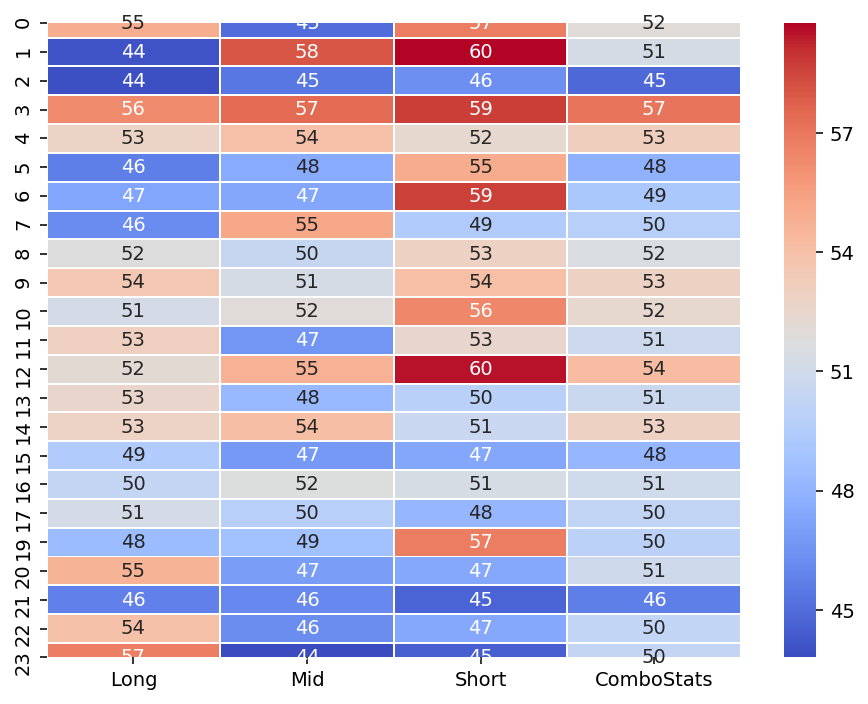

In [136]:
figure, ax = plt.subplots(figsize=(8, 6), dpi=140)
sns.heatmap(results_matrix, annot=True, linewidths=.5, ax=ax, cmap='coolwarm');

### Tendenza

In [137]:
trend = []
trend.append(hour_bias_long)
trend.append(hour_bias_mid)
trend.append(hour_bias_short)

In [138]:
trend_dataframe = pd.DataFrame(trend).transpose()
trend_dataframe.columns = ['Long','Mid','Short']
trend_dataframe["LongTrend"] = trend_dataframe.Long.cumsum()
trend_dataframe["MidTrend"] = trend_dataframe.Mid.cumsum()
trend_dataframe["ShortTrend"] = trend_dataframe.Short.cumsum()
trend_dataframe

,Long,Mid,Short,LongTrend,MidTrend,ShortTrend
0,-0.001931,0.171192,-0.056528,-0.001931,0.171192,-0.056528
1,0.029970,-0.348559,-0.525598,0.028039,-0.177366,-0.582126
2,0.047795,0.015348,0.177665,0.075833,-0.162018,-0.404461
3,-0.160943,-0.546897,-0.555855,-0.085110,-0.708914,-0.960316
4,-0.082720,-0.517571,-0.416458,-0.167830,-1.226485,-1.376773
5,0.026136,0.381460,-0.082684,-0.141693,-0.845026,-1.459457
6,0.054251,0.047418,-0.283253,-0.087442,-0.797608,-1.742710
7,0.281961,-0.168549,0.736041,0.194519,-0.966157,-1.006669
8,-0.407938,0.796396,0.431472,-0.213419,-0.169762,-0.575197
9,-1.000000,-0.043448,-0.271871,-1.213419,-0.213210,-0.847068


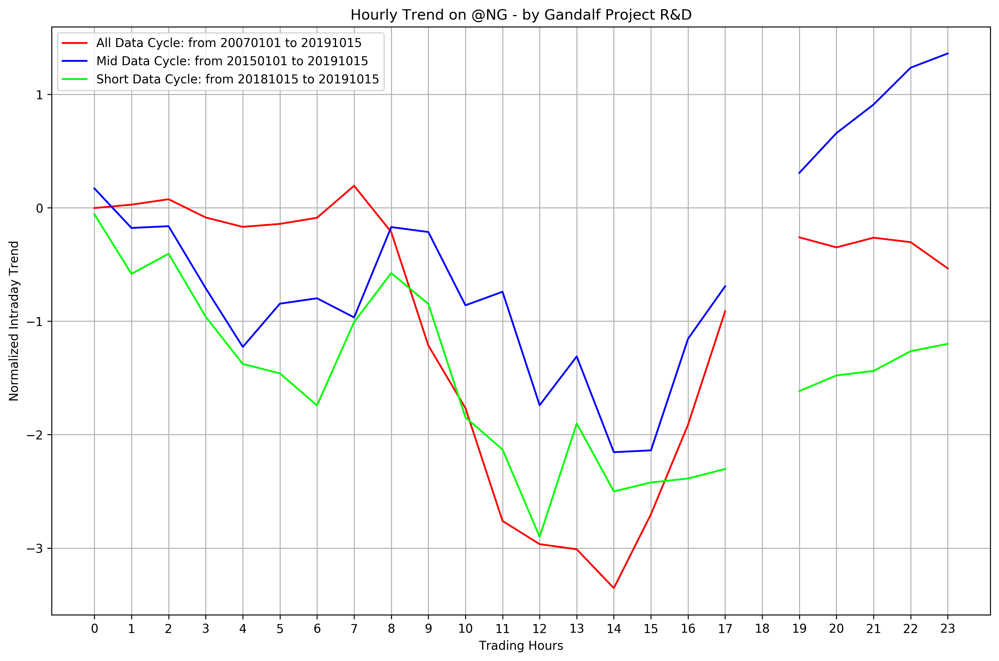

In [139]:
def plot_line(long,mid,short):
    n_groups = 24
    fig, ax = plt.subplots(figsize=(14, 9), dpi=300)
    index = np.arange(n_groups)
    bar_width = 0.30
    opacity = 1

    label_all = "All Data Cycle: from " + startDateLong + " to " + endDateLong
    label_mid = "Mid Data Cycle: from " + startDateMid + " to " + endDateMid
    label_short = "Short Data Cycle: from " + startDateShort + " to " + endDateShort

    rects1 = plt.plot(long, color='red', label=label_all)
    rects2 = plt.plot(mid, color='blue', label=label_mid)
    rects3 = plt.plot(short, color='lime', label=label_short)

    ax.set_xlabel('Trading Hours')
    if normalize == True:
        ax.set_ylabel('Normalized Intraday Trend')
    else:
        ax.set_ylabel('Intraday Trend')
    ax.set_title('Hourly Trend on ' + filename.split('_')[0] + ' - by Gandalf Project R&D')
    ax.set_xticks(index)
    ax.set_xticklabels((['0','1','2','3','4','5','6','7','8','9','10','11','12',
                         '13','14','15','16','17','18','19','20','21','22','23']))
    ax.legend()
    ax.grid(True)
    plt.show()
    return

plot_line(trend_dataframe.LongTrend,
          trend_dataframe.MidTrend,
          trend_dataframe.ShortTrend)

### Day of week

In [140]:
import datetime
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import cufflinks as cf
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()
%matplotlib inline

def load_data(filename):
    """
    Funzione per il parsing di una serie intraday 
    con estensione txt esportata da Tradestation
    """
    data = pd.read_csv(filename, 
                       usecols=['Date','Time','Open','High','Low','Close','Up','Down'], 
                       parse_dates=[['Date', 'Time']], )
    data.columns = ["date_time","open","high","low","close","up","down"]
    data.set_index('date_time', inplace = True)
    data['volume'] = data['up'] + data['down']
    data.drop(['up','down'], axis=1, inplace=True)
    return data

def normalizeMaxMin(array):
    """
    Funzione per normalizzare un array
    che porta ad 1 il valore massimo
    a[i]/max(a) e a -1 il valore minimo a[i]/min(a)
    Funzione che lascia lo zero invariato!
    """
    normalized_array = []
    for element in array:
        if element > 0:
            normalized_array.append(element / max(array))
        else:
            normalized_array.append(-element / min(array))
    return normalized_array

In [141]:
#******* INPUT *********************************

filename = "@NG_60min_Exchange.txt"

startDateLong = "20070101"
endDateLong = "20191015"

startDateMid = "20150101"
endDateMid = "20191015"

startDateShort = "20181015"
endDateShort = "20191015"

normalize = False

#******* INPUT *********************************

In [142]:
dataset = load_data(filename)
dataset["hour"] = dataset.index.hour
dataset['dayofweek'] = dataset.index.dayofweek
dataset['body'] = (dataset.close - dataset.open)
dataset.tail(23)

,open,high,low,close,volume,hour,dayofweek,body
date_time,,,,,,,,
2019-11-14 19:00:00,2.636,2.642,2.618,2.627,1456,19,3,-0.009
2019-11-14 20:00:00,2.628,2.631,2.623,2.628,398,20,3,0.000
2019-11-14 21:00:00,2.628,2.631,2.626,2.630,440,21,3,0.002
2019-11-14 22:00:00,2.629,2.629,2.623,2.626,263,22,3,-0.003
2019-11-14 23:00:00,2.626,2.637,2.626,2.632,512,23,3,0.006
2019-11-15 00:00:00,2.632,2.634,2.609,2.611,1271,0,4,-0.021
2019-11-15 01:00:00,2.611,2.622,2.606,2.613,1900,1,4,0.002
2019-11-15 02:00:00,2.612,2.617,2.609,2.612,495,2,4,0.000
2019-11-15 03:00:00,2.613,2.627,2.609,2.621,1902,3,4,0.008


In [143]:
dow = {"Monday": 0, "Tuesday":1, "Wednesday":2, "Thursday":3, "Friday":4, "Sunday":6}
dow

{'Monday': 0,
 'Tuesday': 1,
 'Wednesday': 2,
 'Thursday': 3,
 'Friday': 4,
 'Sunday': 6}

In [144]:
def plot_hist(long,mid,short,dow):
    n_groups = 24
    fig, ax = plt.subplots(figsize=(14, 9), dpi=300)
    index = np.arange(n_groups)
    bar_width = 0.30
    opacity = 1

    label_all = "All Data Cycle: from " + startDateLong + " to " + endDateLong
    label_mid = "Mid Data Cycle: from " + startDateMid + " to " + endDateMid
    label_short = "Short Data Cycle: from " + startDateShort + " to " + endDateShort

    rects1 = plt.bar(index, long, 
                     bar_width, alpha=opacity, color='red',
                     label=label_all)
    rects2 = plt.bar(index + bar_width, mid, 
                     bar_width, alpha=opacity, color='blue',
                     label=label_mid)
    rects3 = plt.bar(index + 2 * bar_width, short, 
                     bar_width, alpha=opacity, color='lime',
                     label=label_short)

    ax.set_xlabel('Trading Hours')
    if normalize == True:
        ax.set_ylabel('Normalized Points Gain')
    else:
        ax.set_ylabel('Points Gain')
    ax.set_title('Hourly Dependency on ' + filename.split('_')[0] + ' on ' + dow + ' - by Gandalf Project R&D')
    ax.set_xticks(index)
    ax.set_xticklabels((['0','1','2','3','4','5','6','7','8','9','10','11','12',
                         '13','14','15','16','17','18','19','20','21','22','23']))
    ax.legend()
    ax.grid(True)
    plt.show()
    return

In [145]:
def plot_line(long,mid,short,dow):
    n_groups = 24
    fig, ax = plt.subplots(figsize=(14, 9), dpi=300)
    index = np.arange(n_groups)
    bar_width = 0.30
    opacity = 1

    label_all = "All Data Cycle: from " + startDateLong + " to " + endDateLong
    label_mid = "Mid Data Cycle: from " + startDateMid + " to " + endDateMid
    label_short = "Short Data Cycle: from " + startDateShort + " to " + endDateShort

    rects1 = plt.plot(long, color='red', label=label_all)
    rects2 = plt.plot(mid, color='blue', label=label_mid)
    rects3 = plt.plot(short, color='lime', label=label_short)

    ax.set_xlabel('Trading Hours')
    if normalize == True:
        ax.set_ylabel('Normalized Intraday Trend')
    else:
        ax.set_ylabel('Intraday Trend')
    ax.set_title('Hourly Dependency on ' + filename.split('_')[0] + ' on ' + dow + ' - by Gandalf Project R&D')
    ax.set_xticks(index)
    ax.set_xticklabels((['0','1','2','3','4','5','6','7','8','9','10','11','12',
                         '13','14','15','16','17','18','19','20','21','22','23']))
    ax.legend()
    ax.grid(True)
    plt.show()
    return

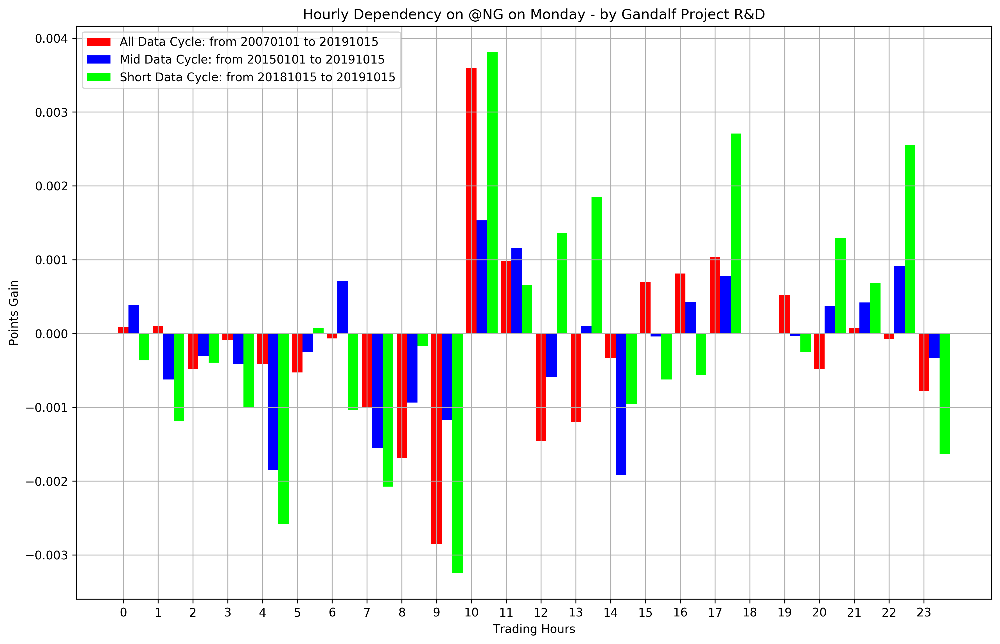

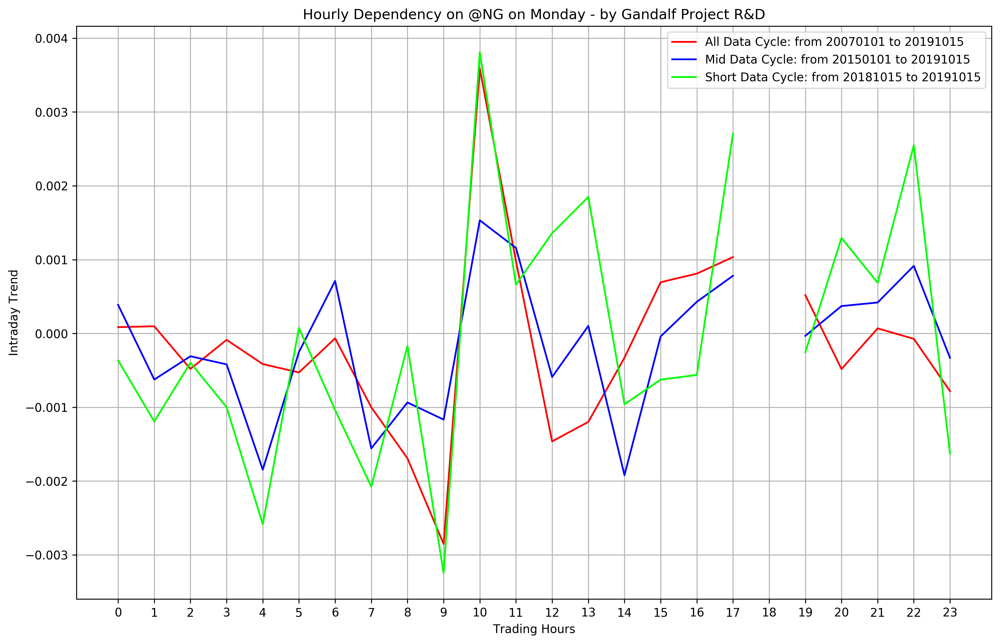

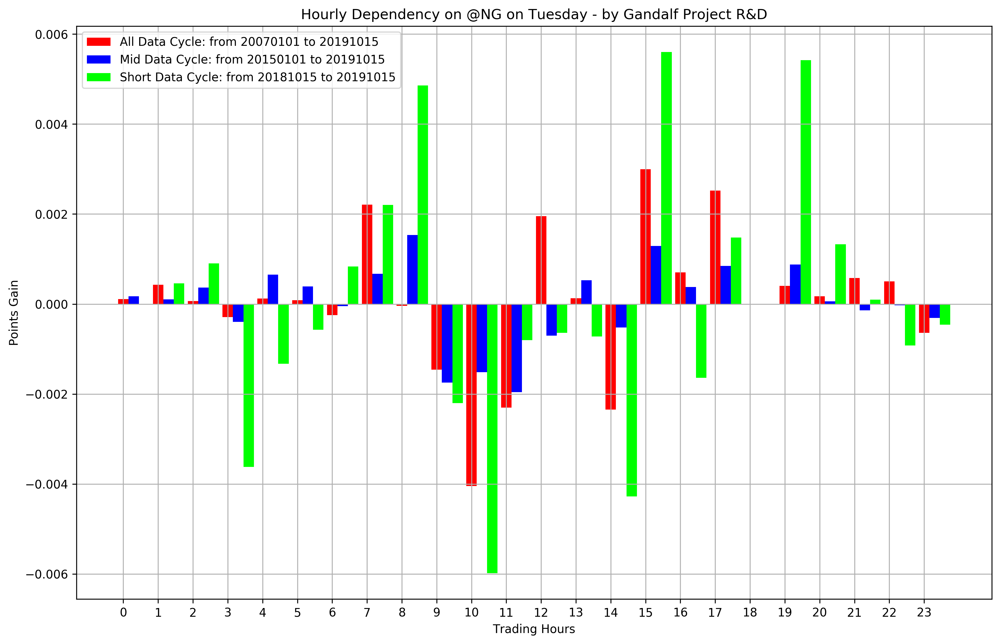

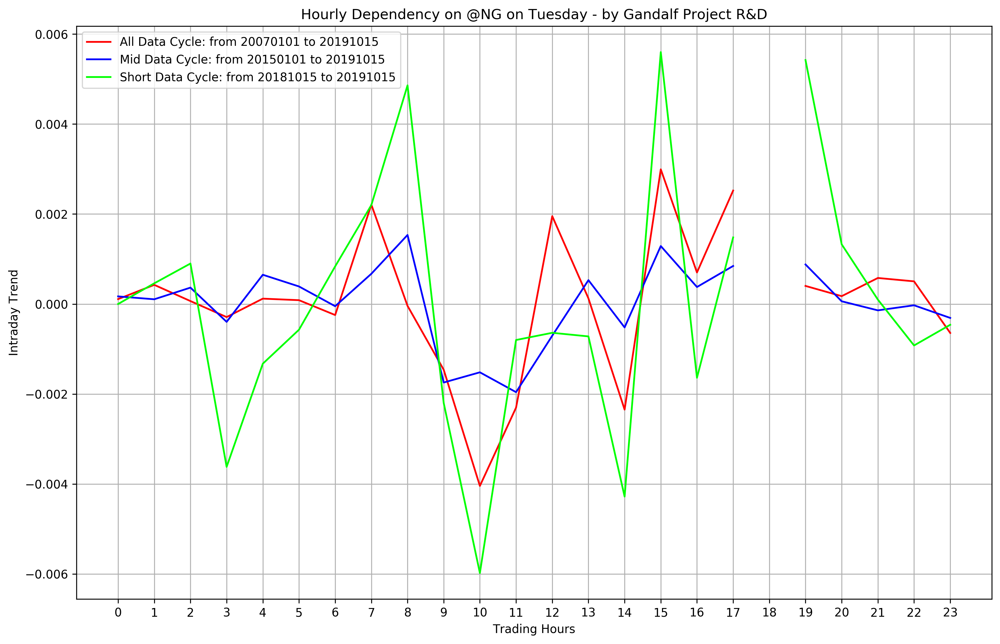

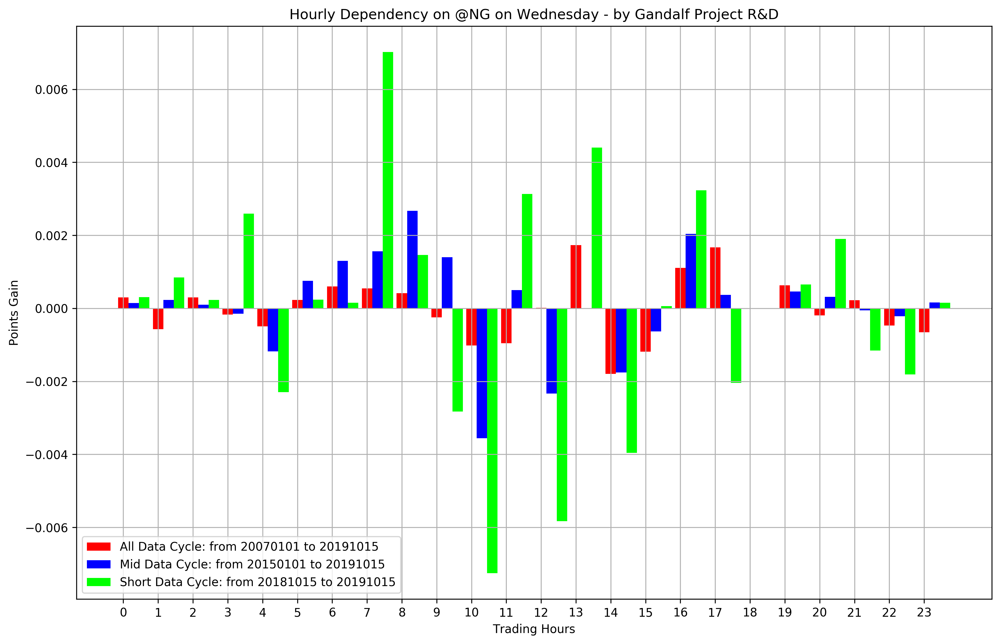

...

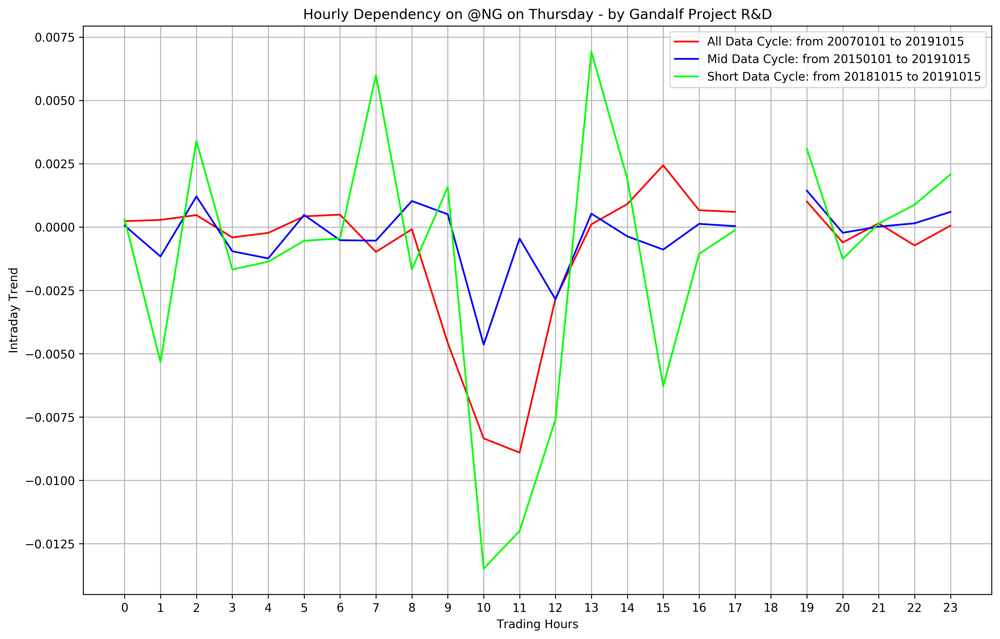

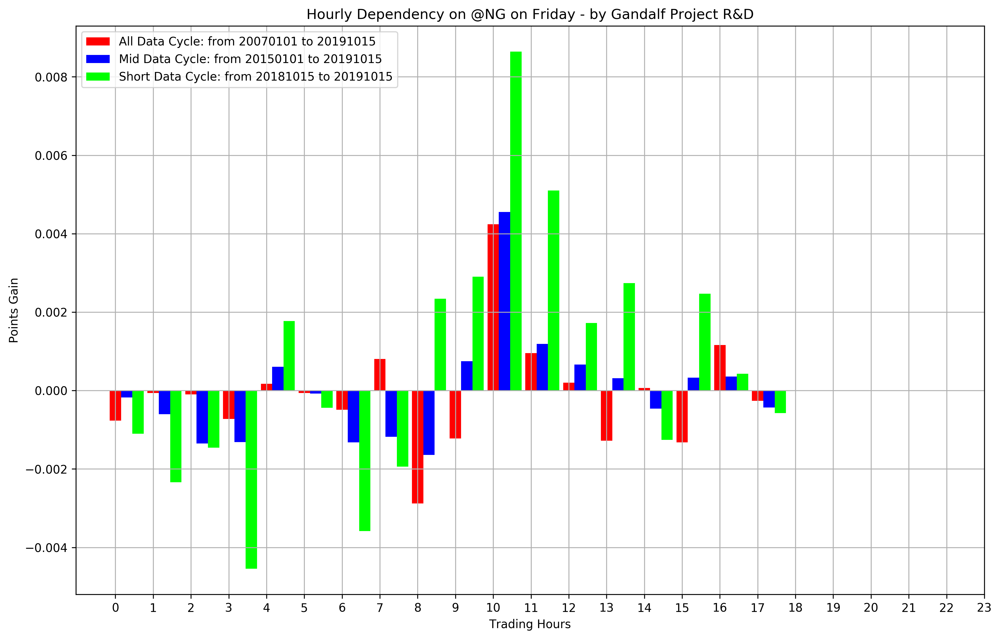

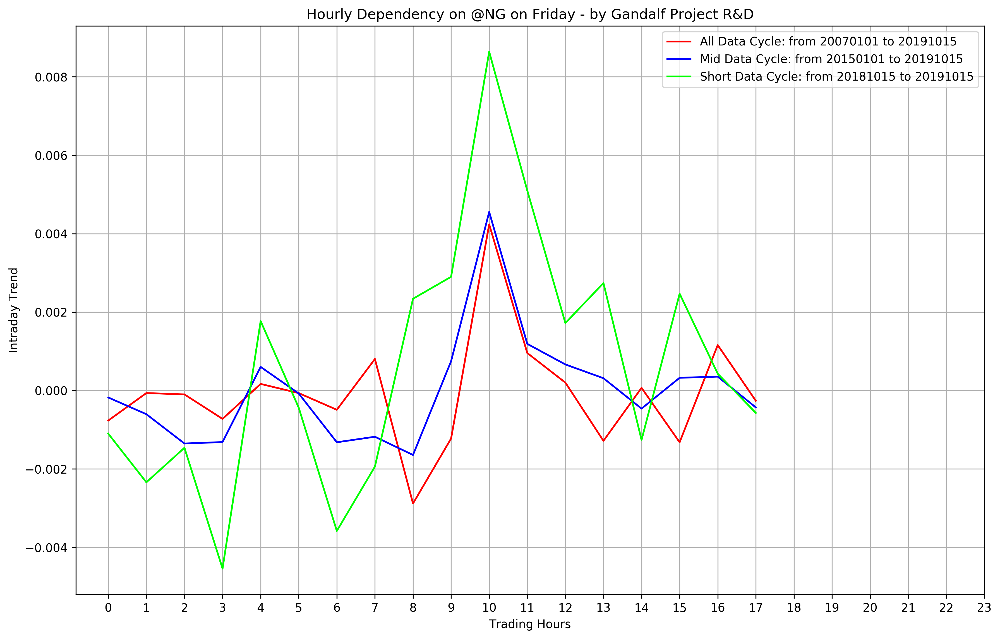

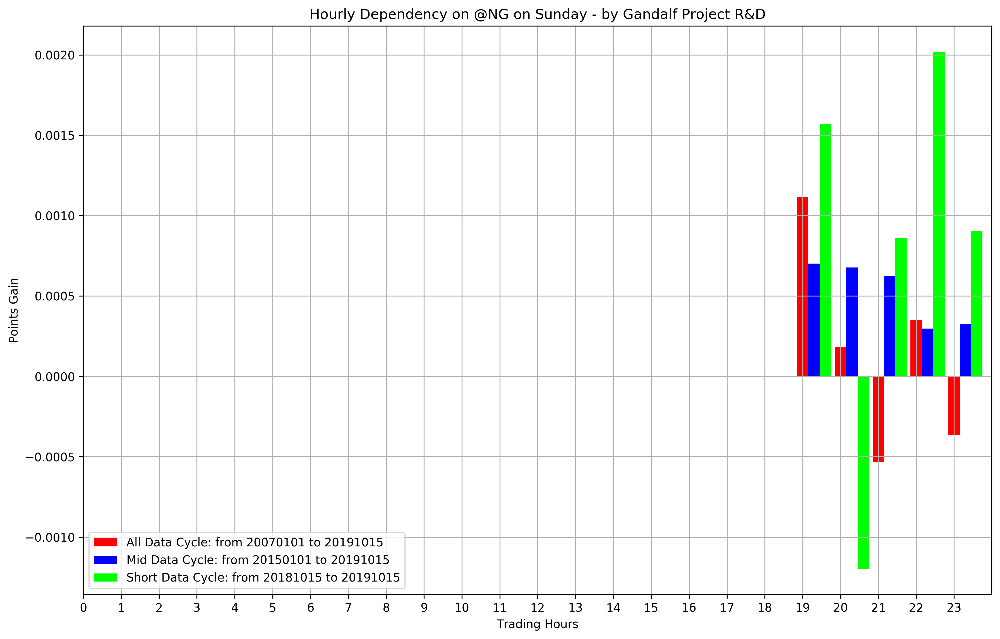

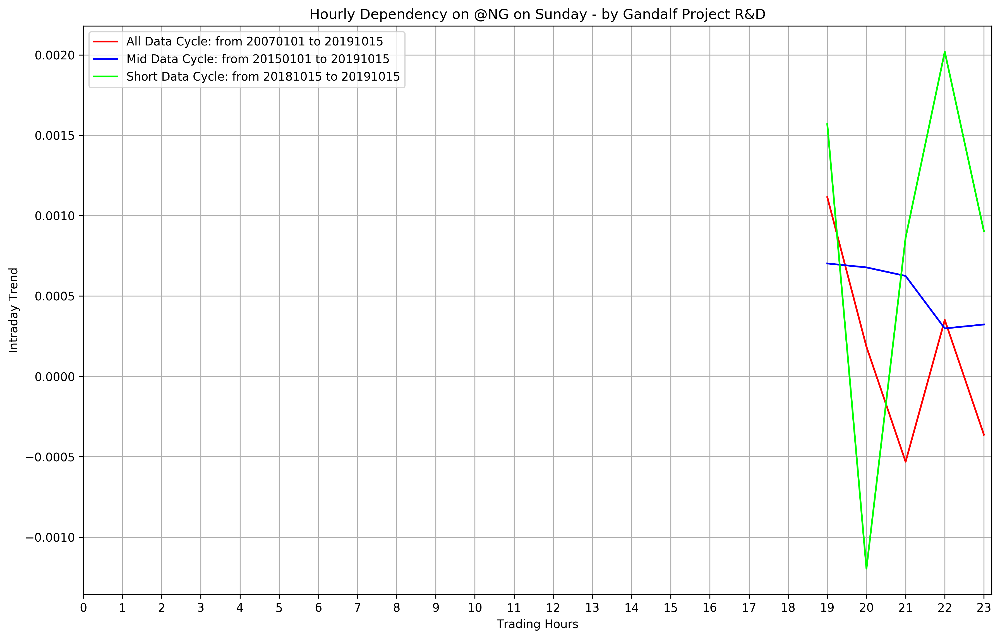

In [146]:
startDateLongParsed = datetime.date(int(startDateLong[0:4]), int(startDateLong[4:6]), int(startDateLong[6:]))
endDateLongParsed = datetime.date(int(endDateLong[0:4]), int(endDateLong[4:6]), int(endDateLong[6:]))

startDateMidParsed = datetime.date(int(startDateMid[0:4]), int(startDateMid[4:6]), int(startDateMid[6:]))
endDateMidParsed = datetime.date(int(endDateMid[0:4]), int(endDateMid[4:6]), int(endDateMid[6:]))

startDateShortParsed = datetime.date(int(startDateShort[0:4]), int(startDateShort[4:6]), int(startDateShort[6:]))
endDateShortParsed = datetime.date(int(endDateShort[0:4]), int(endDateShort[4:6]), int(endDateShort[6:]))

instrument_Long = dataset.loc[startDateLongParsed:endDateLongParsed]
instrument_Mid = dataset.loc[startDateMidParsed:endDateMidParsed]
instrument_Short = dataset.loc[startDateShortParsed:endDateShortParsed]

for key, value in dow.items():
    
    hour_bias_long = []
    hour_bias_mid = []
    hour_bias_short = []

    hours = []
    for hour in range(0,24):
        hours.append(hour)

    for hour in hours:
        hour_bias_long.append(instrument_Long[(instrument_Long.hour == hour) & 
                                                    (instrument_Long.dayofweek == value)].body.mean())
        hour_bias_mid.append(instrument_Mid[(instrument_Mid.hour == hour) & 
                                                  (instrument_Mid.dayofweek == value)].body.mean())
        hour_bias_short.append(instrument_Short[(instrument_Short.hour == hour) & 
                                                      (instrument_Short.dayofweek == value)].body.mean())

    if normalize == True:
        hour_bias_long = normalizeMaxMin(hour_bias_long)
        hour_bias_mid = normalizeMaxMin(hour_bias_mid)
        hour_bias_short = normalizeMaxMin(hour_bias_short)
        
    plot_hist(hour_bias_long,hour_bias_mid,hour_bias_short,key)
    plot_line(hour_bias_long,hour_bias_mid,hour_bias_short,key)